In [1]:
import util
import numpy as np
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
path = "DATA/IR VIS HAK/"

imgs_rgb, imgs_ir = util.loadDataset(path, "SAVE_2_visible_noBlack_frames", "SAVE_2_IR0_noBlack_frames")

In [3]:
def auto_canny(image, sigma=0.33):
    # compute the median of the single channel pixel intensities
    v = np.median(image)
    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
    # return the edged image
    return edged

In [4]:
no = 4231#1234#4231#10541 #4231
imgs_rgb_cont = cv2.addWeighted( imgs_rgb[no], 2, imgs_rgb[no], 0, 0)
imgs_ir_cont = cv2.addWeighted( imgs_ir[no], 0.5, imgs_ir[no], 0, 0)

imgs_ir_cont = cv2.GaussianBlur(imgs_ir_cont, (7, 7), 1.)
imgs_rgb_cont = cv2.GaussianBlur(imgs_rgb_cont, (7, 7), 1.5)

#imgGrad = util.gradMagnitude(imgs_ir_cont)
#sobelxy[sobelxy > 15] = 800

imgGradRGB = util.gradMagnitude(imgs_rgb_cont)
imgGrad = auto_canny(imgs_ir_cont, 0.05)#cv2.Canny(imgs_ir_cont,10,20)

edges = auto_canny(imgs_rgb_cont) #cv2.Canny(imgs_rgb_cont,130,220)

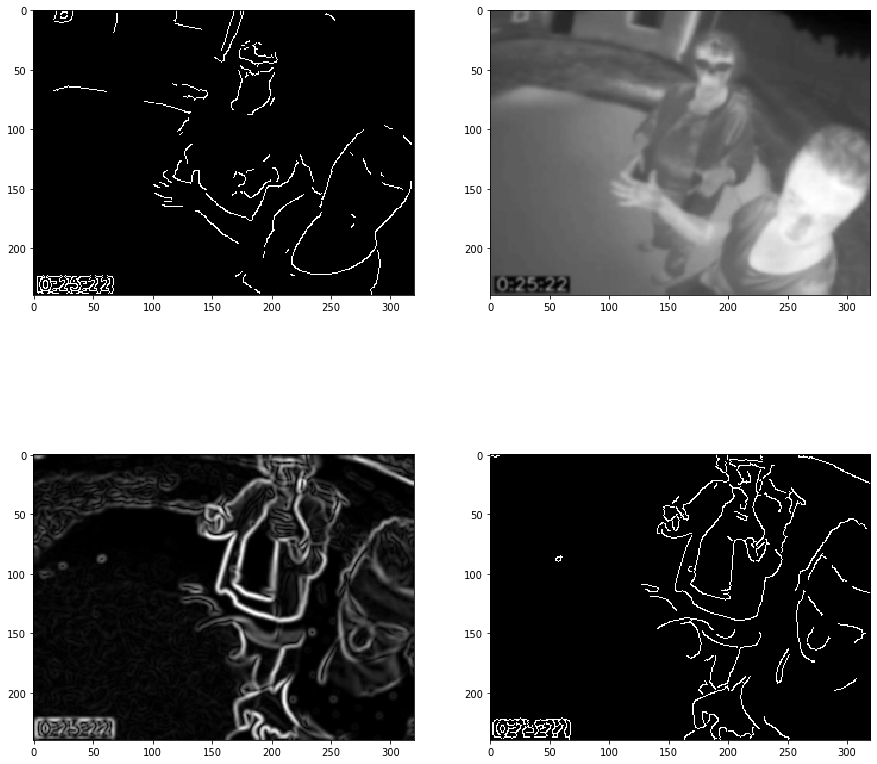

In [5]:
plt.figure(figsize=(15,15))

plt.subplot(221)
plt.imshow(imgGrad, cmap='gray')

plt.subplot(222)
plt.imshow(imgs_ir_cont, cmap='gray')

plt.subplot(223)
plt.imshow(imgGradRGB, cmap='gray')

plt.subplot(224)
plt.imshow(edges, cmap='gray')

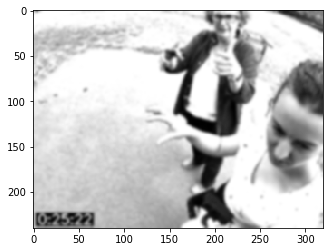

In [6]:
plt.imshow(imgs_rgb_cont, cmap='gray')

In [7]:
no = 9900#10541 #4231
imgs_rgb_cont = cv2.addWeighted( imgs_rgb[no], 1.5, imgs_rgb[no], 0,0)
imgs_ir_cont = imgs_ir[no]#v2.addWeighted( imgs_ir[no], 1, imgs_ir[no], 1 0)

imgs_ir_cont = cv2.GaussianBlur(imgs_ir_cont, (7, 7), 1.5)
imgs_rgb_cont = cv2.GaussianBlur(imgs_rgb_cont, (7, 7), 1.5)

#imgGrad = util.gradMagnitude(imgs_ir_cont)
#sobelxy[sobelxy > 15] = 800

imgGradRGB = util.gradMagnitude(imgs_rgb_cont)
imgGrad = auto_canny(imgs_ir_cont, 0.05)#cv2.Canny(imgs_ir_cont,10,20)

edges = auto_canny(imgs_rgb_cont) #cv2.Canny(imgs_rgb_cont,130,220)

#ret, thresh = cv2.threshold(imgs_rgb_cont,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
#thresh = cv2.Laplacian(imgs_rgb_cont, cv2.CV_8U, ksize=5)
thresh = cv2.adaptiveThreshold(imgs_rgb_cont,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
#thresh_ir = cv2.Laplacian(imgs_ir_cont, cv2.CV_8U, ksize=5)
thresh_ir = cv2.adaptiveThreshold(imgs_ir_cont,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
number_contours = len(contours)
print(number_contours)
for i in range(0, number_contours):
    lenght = cv2.contourArea(contours[i])
    if float(1)<lenght<float(5000):
        cv2.drawContours(thresh, contours[i], 0, (255,255,255), 7)

#thresh = cv2.medianBlur(thresh, 5)

545


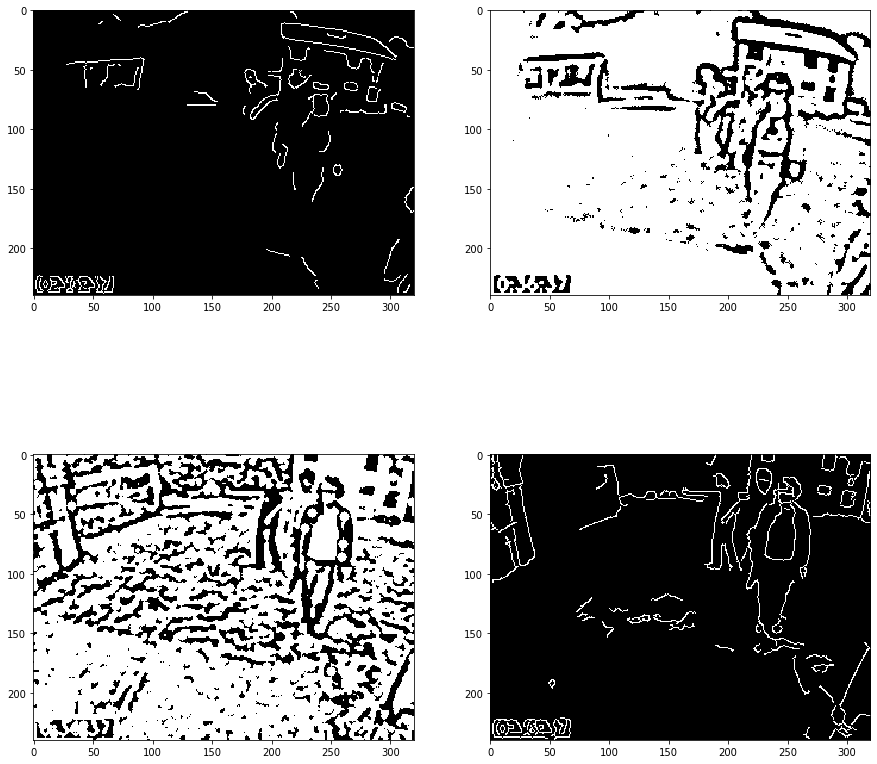

In [8]:
plt.figure(figsize=(15,15))

plt.subplot(221)
plt.imshow(imgGrad, cmap='gray')

plt.subplot(222)
plt.imshow(thresh_ir, cmap='gray')

plt.subplot(223)
plt.imshow(thresh, cmap='gray')

plt.subplot(224)
plt.imshow(edges, cmap='gray')

In [9]:
imgs_rgb_filtered = []
imgs_ir_filtered = []
for i in range(0, imgs_rgb.shape[0]):
    imgs_rgb_cont = cv2.addWeighted( imgs_rgb[i], 2, imgs_rgb[i], 0,0)
    imgs_ir_cont = cv2.addWeighted( imgs_ir[i], 0.5, imgs_ir[i], 0, 0)

    imgs_ir_cont = cv2.GaussianBlur(imgs_ir_cont, (7, 7), 1.5)
    imgs_rgb_cont = cv2.GaussianBlur(imgs_rgb_cont, (7, 7), 1.5)
    
    imgs_ir_cont = auto_canny(imgs_ir_cont, 0.05)#cv2.Canny(imgs_ir_cont,10,20)
    imgs_rgb_cont = auto_canny(imgs_rgb_cont) #cv2.Canny(imgs_rgb_cont,130,220)
    
    imgs_rgb_filtered.append(imgs_rgb_cont)
    imgs_ir_filtered.append(imgs_ir_cont)

imgs_rgb_filtered = np.array(imgs_rgb_filtered)
imgs_ir_filtered = np.array(imgs_ir_filtered)

In [10]:
imgs_rgb_filtered = []
imgs_ir_filtered = []
for i in range(0, 10000):
    imgs_rgb_cont = cv2.addWeighted( imgs_rgb[i], 2, imgs_rgb[i], 0,0)
    imgs_ir_cont = cv2.addWeighted( imgs_ir[i], 0.5, imgs_ir[i], 0, 0)

    imgs_ir_cont = cv2.GaussianBlur(imgs_ir_cont, (7, 7), 1.5)
    imgs_rgb_cont = cv2.GaussianBlur(imgs_rgb_cont, (7, 7), 1.5)
    
    #imgs_ir_cont = auto_canny(imgs_ir_cont, 0.05)#cv2.Canny(imgs_ir_cont,10,20)
    #imgs_rgb_cont = auto_canny(imgs_rgb_cont) #cv2.Canny(imgs_rgb_cont,130,220)
    imgs_rgb_cont = cv2.Laplacian(imgs_rgb_cont, cv2.CV_8U, ksize=5)
    imgs_ir_cont = cv2.Laplacian(imgs_ir_cont, cv2.CV_8U, ksize=5)
    
    imgs_rgb_filtered.append(imgs_rgb_cont)
    imgs_ir_filtered.append(imgs_ir_cont)

imgs_rgb_filtered = np.array(imgs_rgb_filtered)
imgs_ir_filtered = np.array(imgs_ir_filtered)

In [11]:
imgs_rgb_filtered = []
imgs_ir_filtered = []
for i in range(0, imgs_rgb.shape[0]):
    imgs_rgb_cont = cv2.addWeighted( imgs_rgb[i], 2, imgs_rgb[i], 0,0)
    imgs_ir_cont = cv2.addWeighted( imgs_ir[i], 0.5, imgs_ir[i], 0, 0)

    imgs_ir_cont = cv2.GaussianBlur(imgs_ir_cont, (7, 7), 1.5)
    imgs_rgb_cont = cv2.GaussianBlur(imgs_rgb_cont, (7, 7), 5)
    
    imgs_rgb_cont = cv2.adaptiveThreshold(imgs_rgb_cont,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    imgs_ir_cont = cv2.adaptiveThreshold(imgs_ir_cont,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,15,2)
    
    """contours, hierarchy = cv2.findContours(imgs_rgb_cont,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    number_contours = len(contours)
    for i in range(0, number_contours):
        lenght = cv2.contourArea(contours[i])
        if float(1)<lenght<float(5000):
            cv2.drawContours(imgs_rgb_cont, contours[i], 0, (255,255,255), 7)
    """
    imgs_rgb_filtered.append(imgs_rgb_cont)
    imgs_ir_filtered.append(imgs_ir_cont)

imgs_rgb_filtered = np.array(imgs_rgb_filtered)
imgs_ir_filtered = np.array(imgs_ir_filtered)

C:\Users\lucaw\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


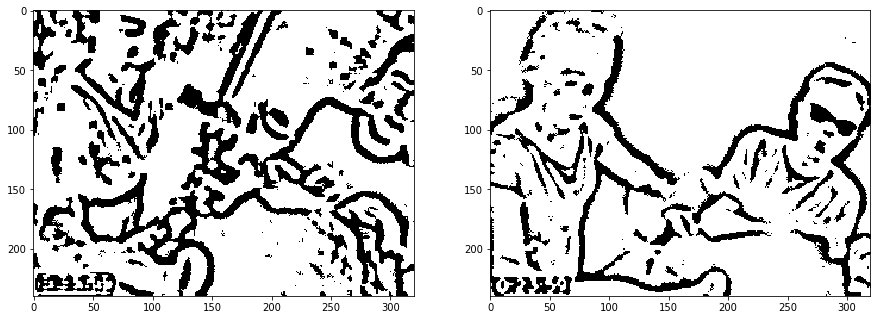

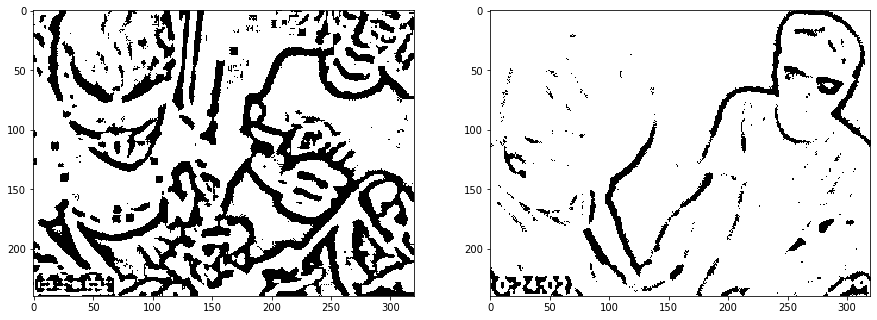

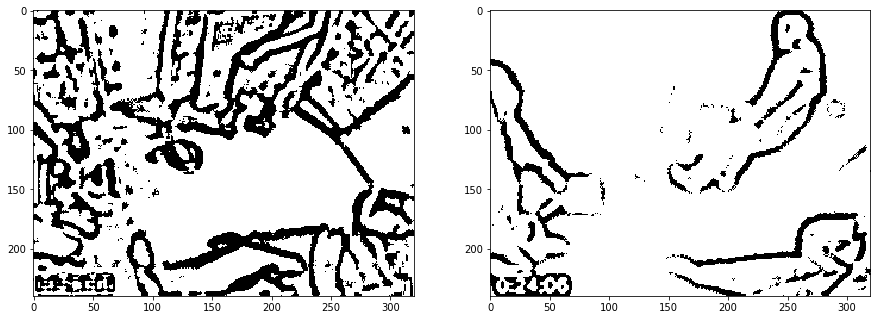

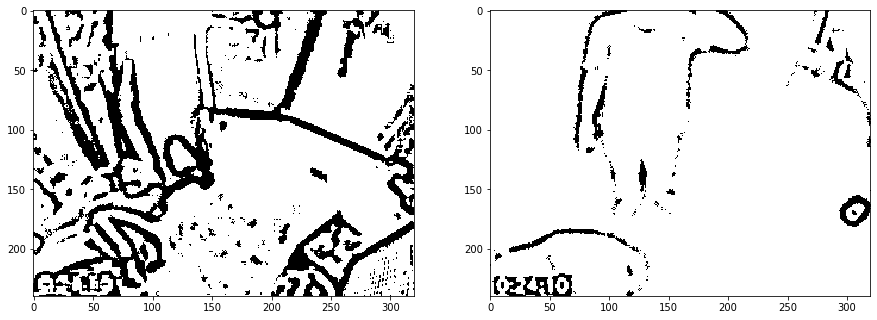

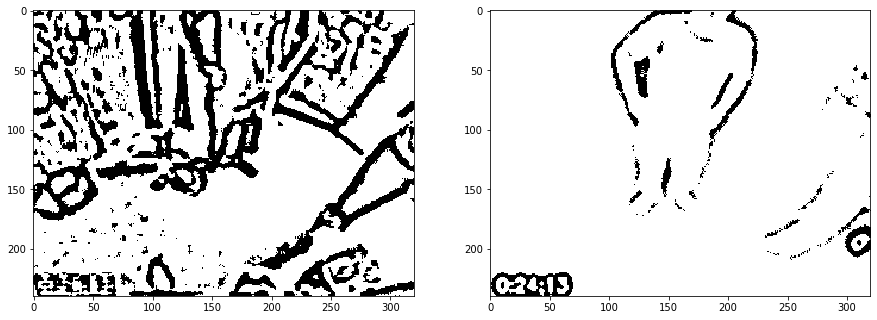

...

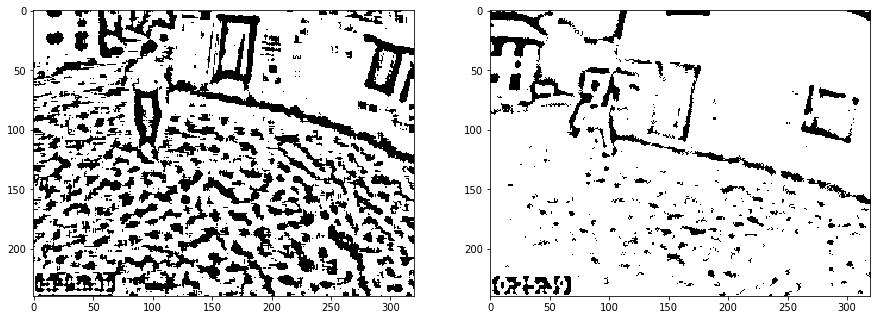

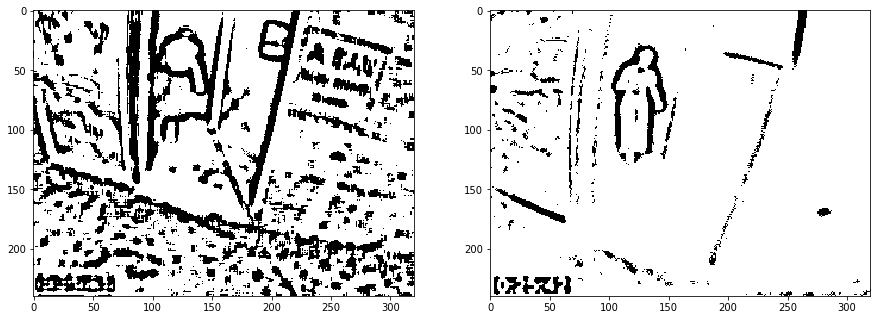

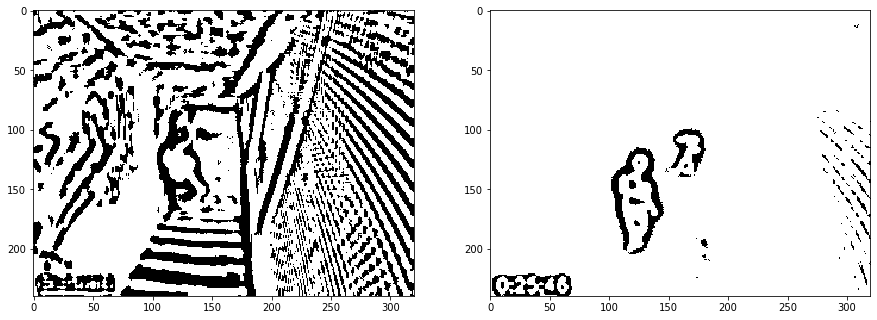

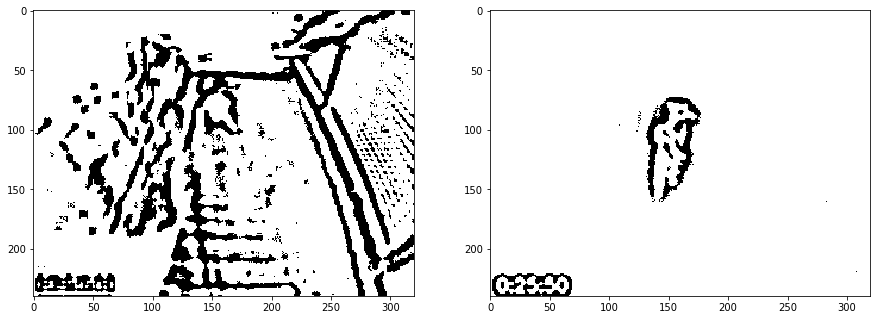

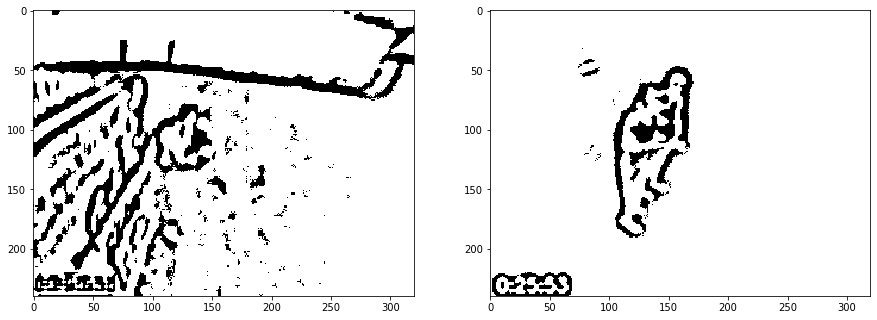

In [12]:
imgs_rgb_filtered.shape

for i in range(3500, 4500, 30):
    plt.figure(figsize=(15,15))
    plt.subplot(121)
    plt.imshow(imgs_rgb_filtered[i], cmap='gray')

    plt.subplot(122)
    plt.imshow(imgs_ir_filtered[i], cmap='gray')

In [13]:
#util.saveImages(imgs_ir_filtered, "DATA/IR VIS HAK/images_ir_laplacian")

C:\Users\lucaw\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


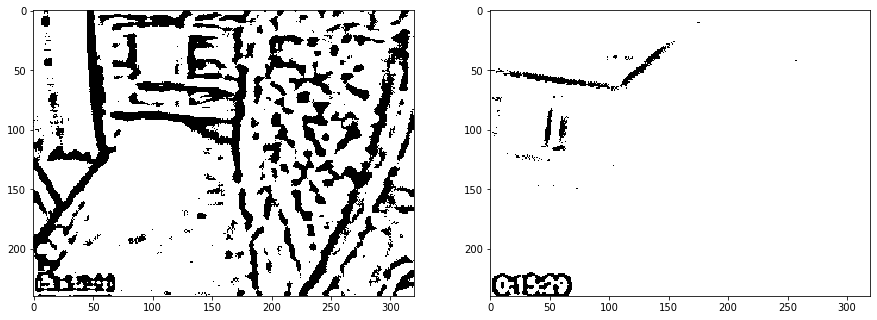

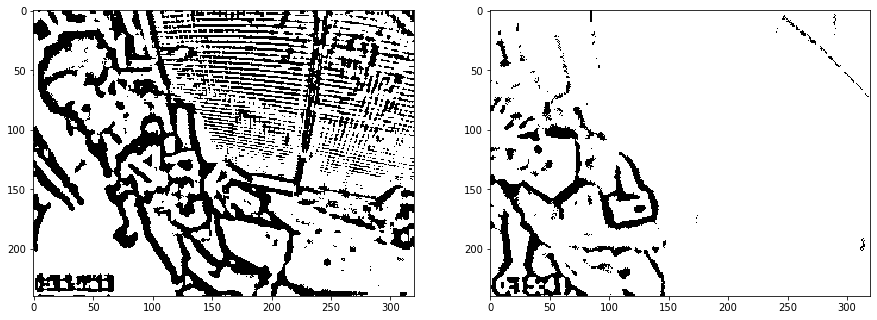

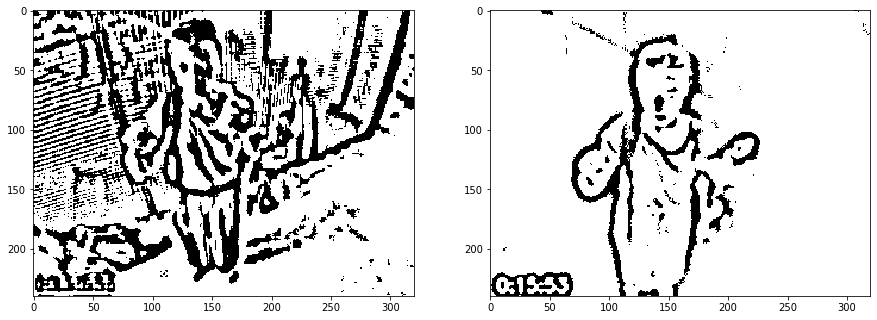

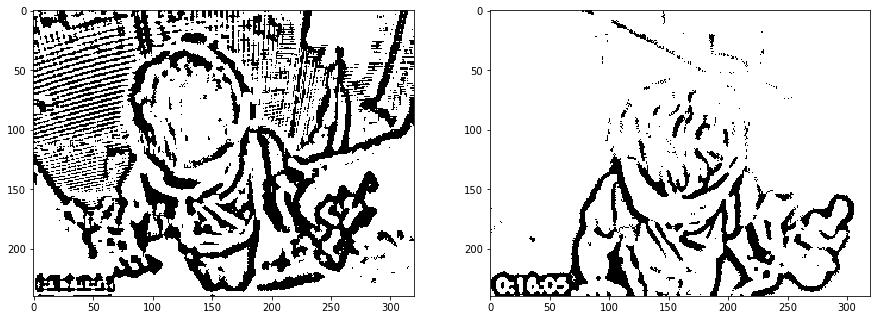

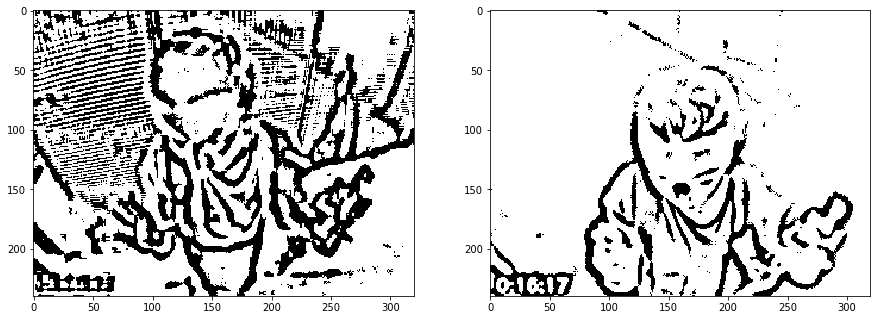

...

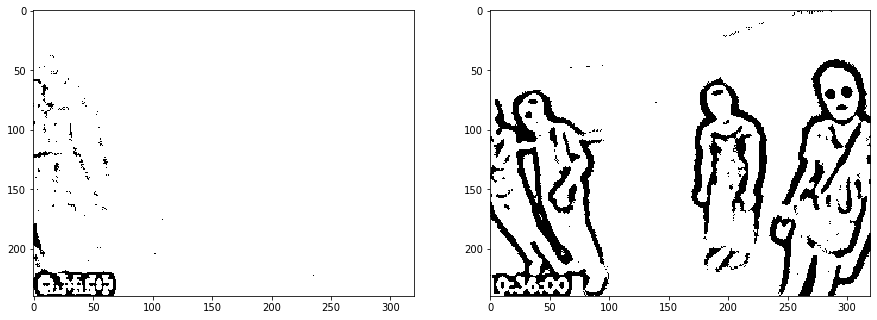

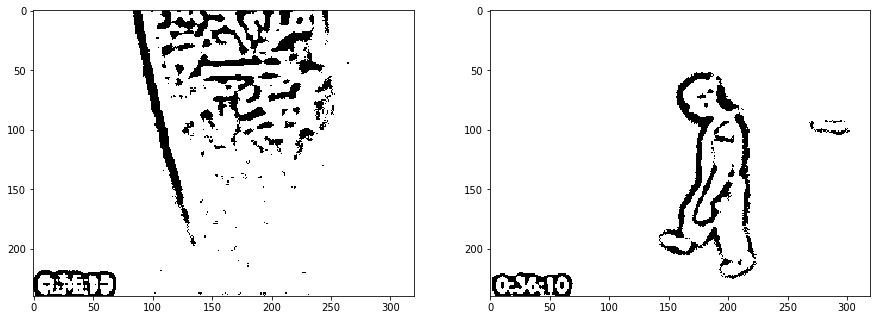

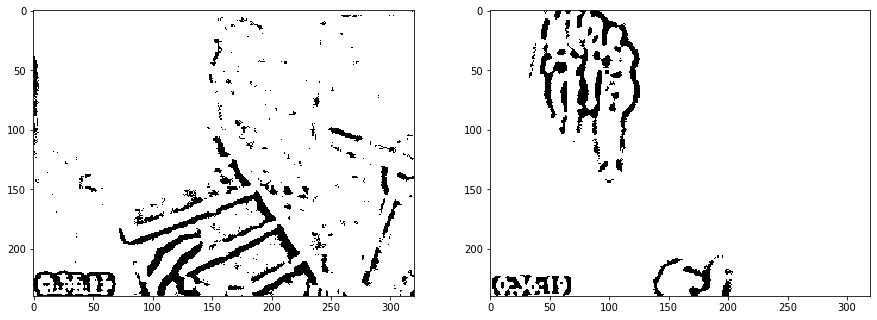

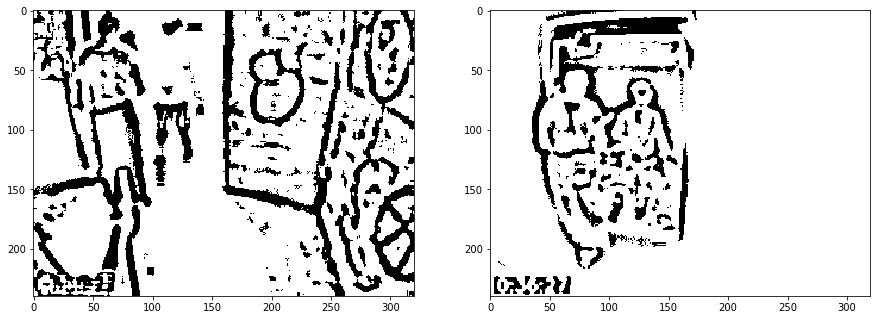

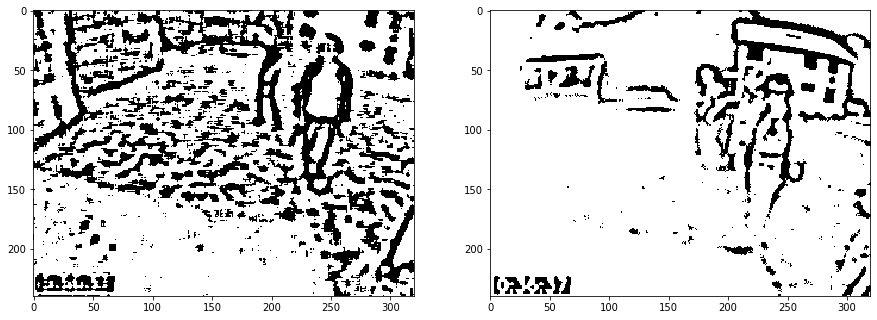

In [14]:
imgs_rgb_filtered.shape

for i in range(0, 10000, 100):
    plt.figure(figsize=(15,15))
    plt.subplot(121)
    plt.imshow(imgs_rgb_filtered[i], cmap='gray')

    plt.subplot(122)
    plt.imshow(imgs_ir_filtered[i], cmap='gray')

In [15]:
no = 4323
sigma = 1
ksize = (3, 3)
im1 = cv2.GaussianBlur(imgs_rgb[no], ksize, sigma)
im1 = im1.astype(float)
im2 = cv2.GaussianBlur(imgs_rgb[no+1], ksize, sigma)
im2 = im2.astype(float)
imDiff = np.abs(im1 - im2)
imDiff2 = im1 - im2

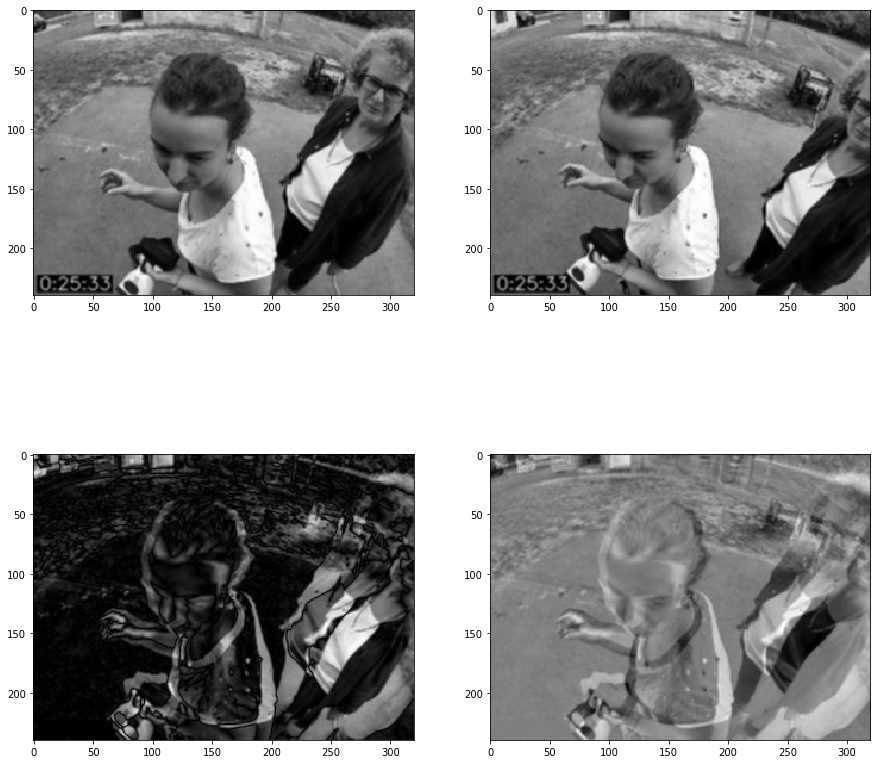

In [16]:
plt.figure(figsize=(15,15))

plt.subplot(221)
plt.imshow(im1, cmap='gray')

plt.subplot(222)
plt.imshow(im2, cmap='gray')

plt.subplot(223)
plt.imshow(imDiff, cmap='gray')

plt.subplot(224)
plt.imshow(imDiff2, cmap='gray')

In [17]:
im1 = cv2.GaussianBlur(imgs_ir[no], ksize, sigma)
im1 = im1.astype(float)
im2 = cv2.GaussianBlur(imgs_ir[no+1], ksize, sigma)
im2 = im2.astype(float)
imDiff = np.abs(im1 - im2)
imDiff2 = im1 - im2

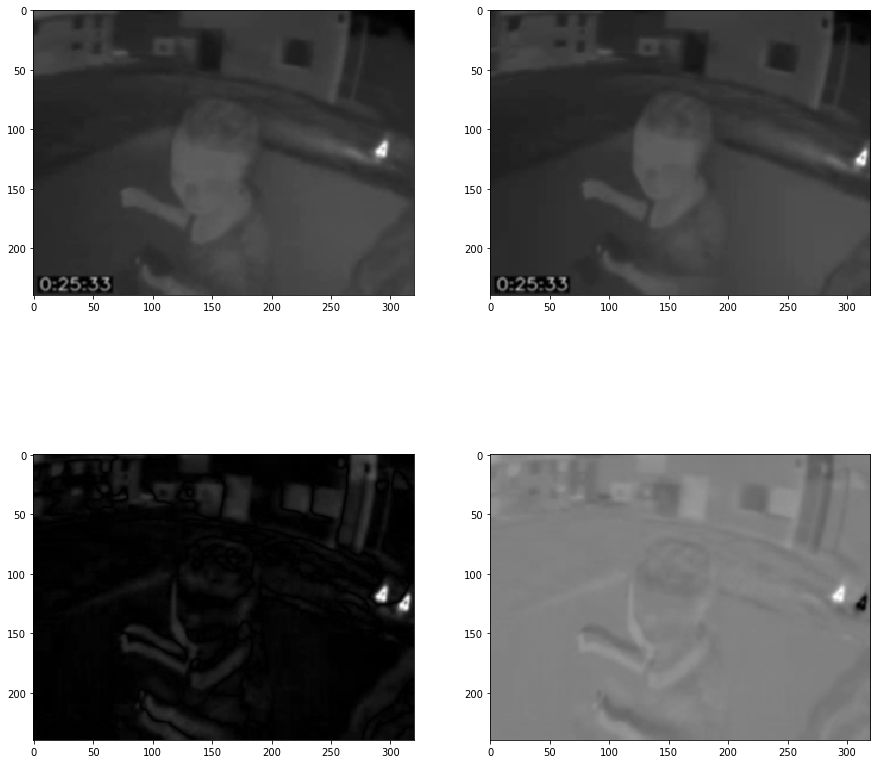

In [18]:
plt.figure(figsize=(15,15))

plt.subplot(221)
plt.imshow(im1, cmap='gray')

plt.subplot(222)
plt.imshow(im2, cmap='gray')

plt.subplot(223)
plt.imshow(imDiff, cmap='gray')

plt.subplot(224)
plt.imshow(imDiff2, cmap='gray')

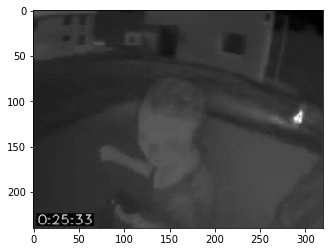

In [19]:
plt.imshow(imgs_ir[4323], cmap='gray')

In [20]:
imgs_ir[4323, 132, 159]

85

In [21]:
thresh_img = []
for n in range(3500, 4500):
    test_thresh = imgs_ir[n].copy()
    for i in range(0, test_thresh.shape[0]):
        for j in range(0, thresh.shape[1]):
            if test_thresh[i, j] > 110: #and test_thresh[i, j] < 150:
                test_thresh[i, j] = 0
            else:
                test_thresh[i, j] = 255
    thresh_img.append(test_thresh)
thresh_img = np.array(thresh_img)

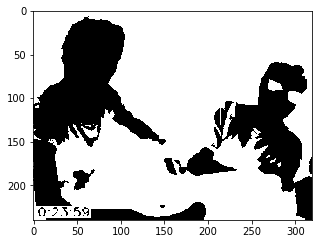

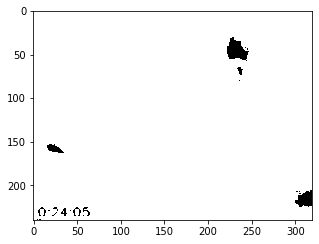

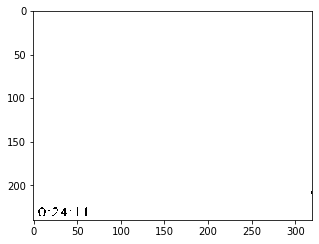

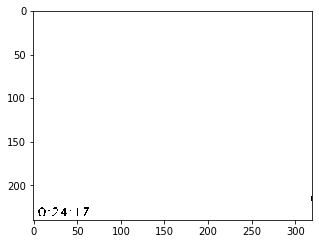

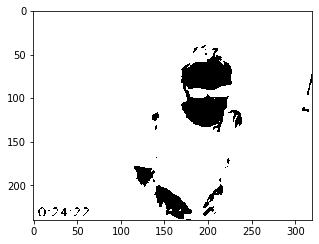

...

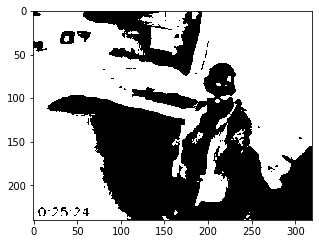

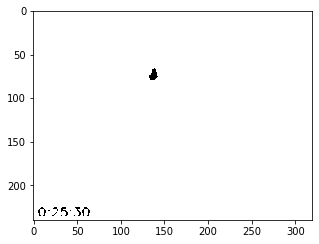

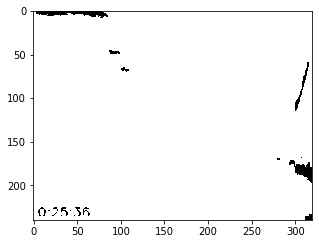

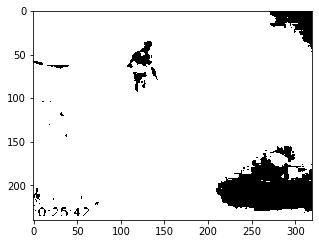

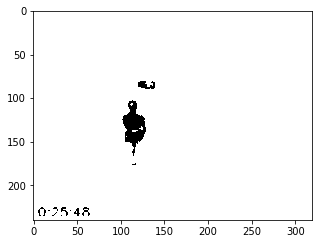

In [22]:
for i in range(0, 1000, 50):
    plt.figure(figsize=(5,5))
    plt.imshow(thresh_img[i], cmap='gray')

In [ ]:
for i in range(3500, 4500, 50):
    plt.figure(figsize=(5,5))
    plt.imshow(imgs_ir[i], cmap='gray')

In [2]:
path = "DATA/IR VIS HAK/"

imgs_rgb, imgs_ir = util.loadDataset2(path, "SAVE_2_visible_noBlack_frames", "SAVE_2_IR0_noBlack_frames")

In [3]:
imgs_ir.shape

(12633, 240, 320, 3)

In [4]:
im_res_b = imgs_ir[4323, 132, 159, 0]
im_res_g = imgs_ir[4323, 132, 159, 1]
im_res_r = imgs_ir[4323, 132, 159, 2]
print(im_res_r, im_res_g, im_res_b)

0 104 211


In [5]:
res = np.zeros((240, 320))
res.shape

(240, 320)

In [15]:
thresh_img = []
for n in range(0, 5000):
    test_thresh = imgs_ir[n, :, :, 0].copy()
    for i in range(0, test_thresh.shape[0]):
        for j in range(0, test_thresh.shape[1]):
            if test_thresh[i, j] > 160: #and test_thresh[i, j] < 150: (170)
                test_thresh[i, j] = 0
            else:
                test_thresh[i, j] = 255
    thresh_img.append(test_thresh)
thresh_img = np.array(thresh_img)

C:\Users\lucaw\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


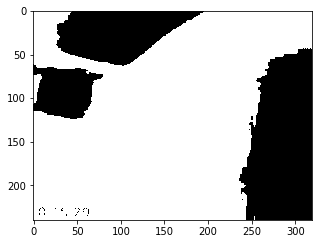

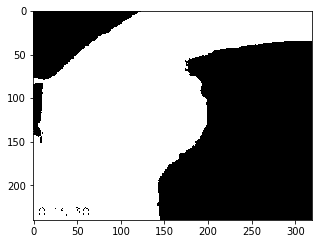

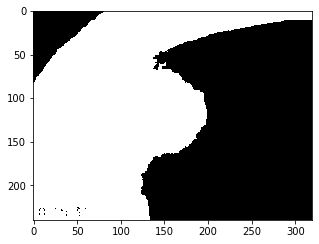

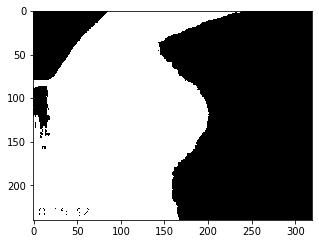

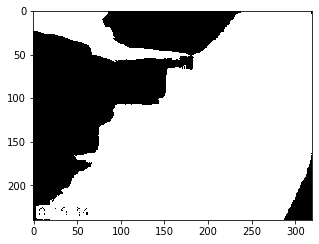

...

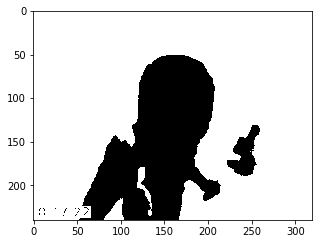

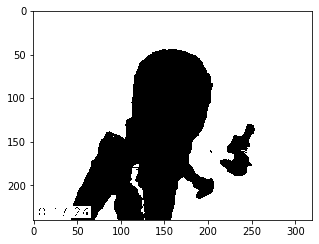

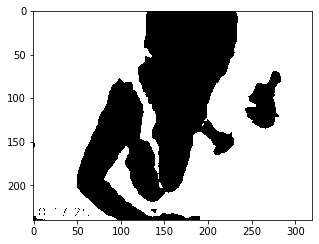

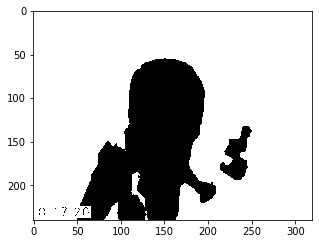

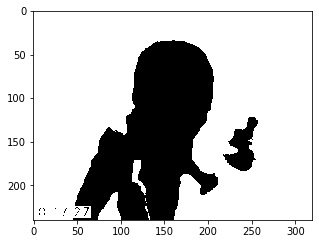

In [16]:
for i in range(0, 1000, 10):
    plt.figure(figsize=(5,5))
    plt.imshow(thresh_img[i], cmap='gray')

C:\Users\lucaw\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


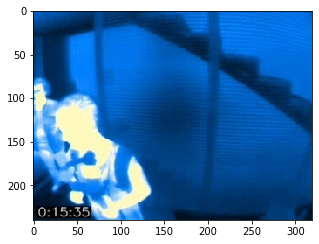

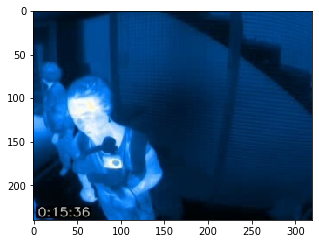

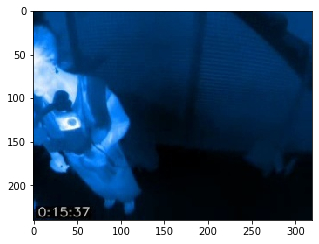

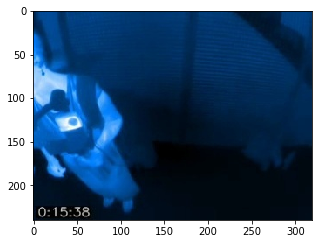

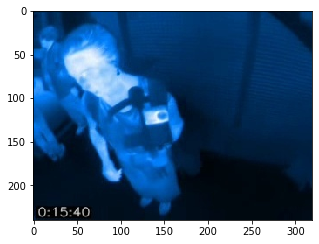

...

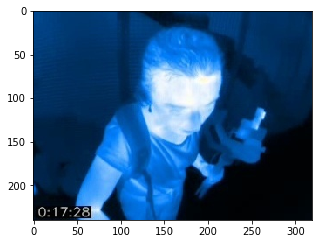

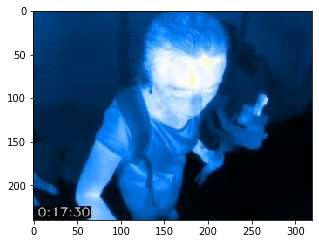

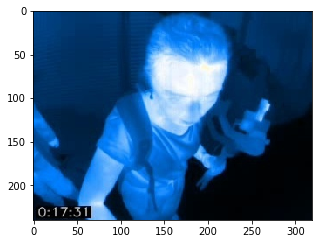

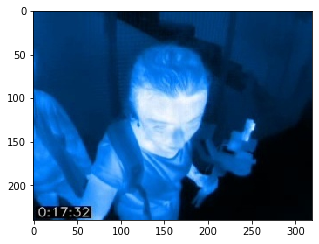

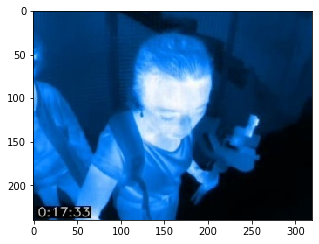

In [30]:
for i in range(50, 1050, 10):
    plt.figure(figsize=(5,5))
    plt.imshow(cv2.cvtColor(imgs_ir[i], cv2.COLOR_BGR2RGB))

In [17]:
util.saveImages(thresh_img, "DATA/IR VIS HAK/ir_thresh2")